In [1]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Copying Images
If you want to reassign an array to another variable, you should use the copy method.

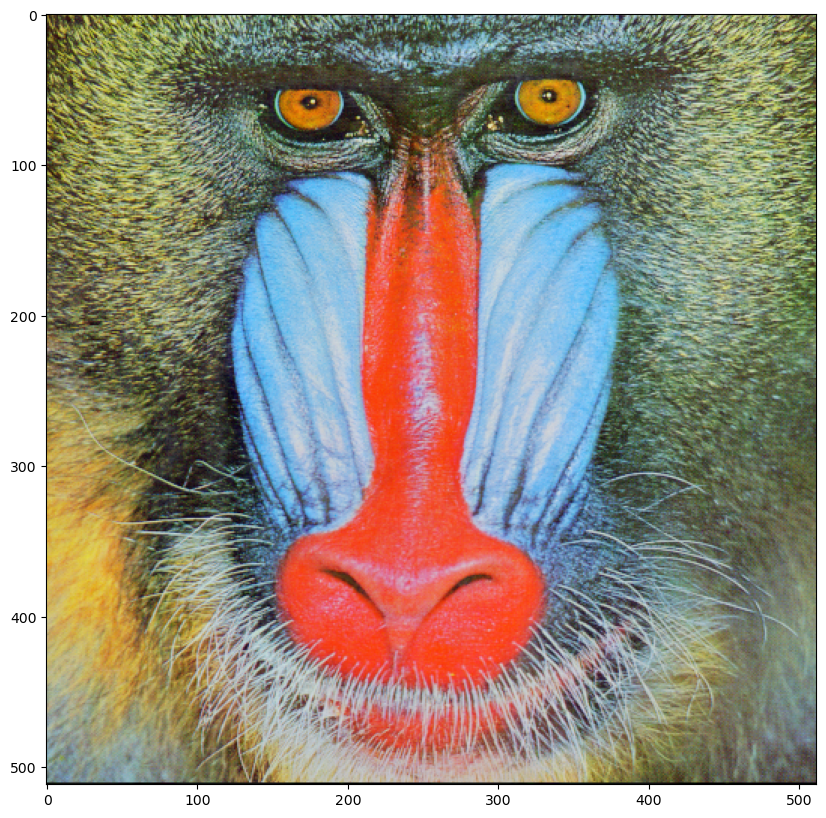

In [11]:
baboon = np.array(Image.open('baboon.png'))
plt.figure(figsize = (10,10))
plt.imshow(baboon)
plt.show()

In [12]:
A = baboon

In [13]:
id(A) == id(baboon)

True

In [14]:
B = baboon.copy()
id(B) == id(baboon)

False

In [15]:
#baboon[:,:,] = 0

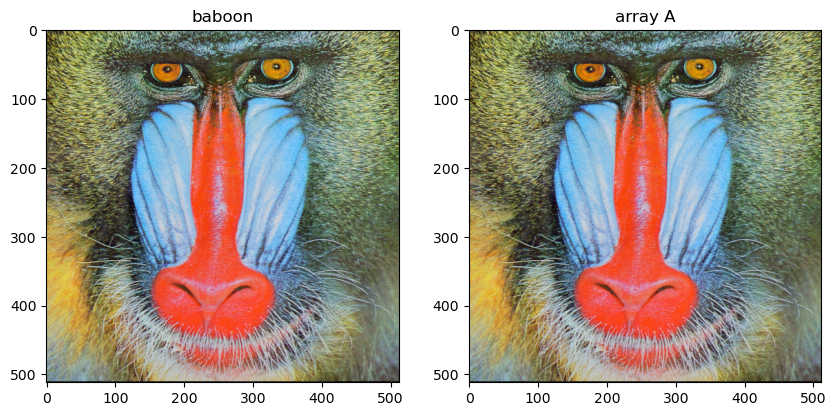

In [16]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(baboon)
plt.title("baboon")
plt.subplot(122)
plt.imshow(A)
plt.title("array A")
plt.show()

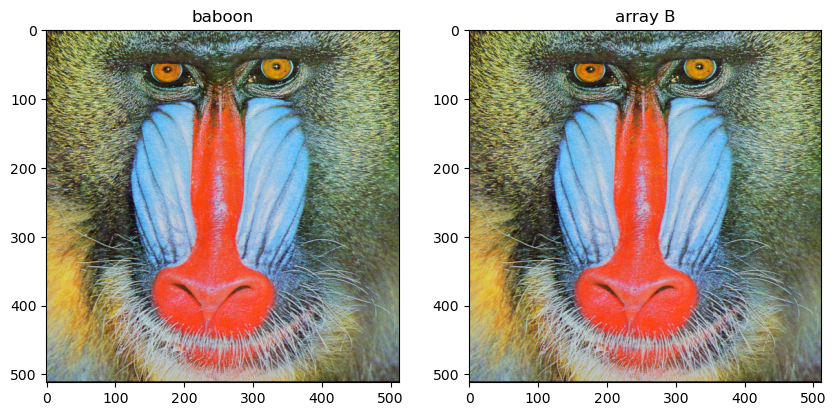

In [17]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(baboon)
plt.title("baboon")
plt.subplot(122)
plt.imshow(B)
plt.title("array B")
plt.show()

# Flipping Images
Flipping images involves reordering the indices of the pixels such that it changes the orientation of the image. Consider the following image:

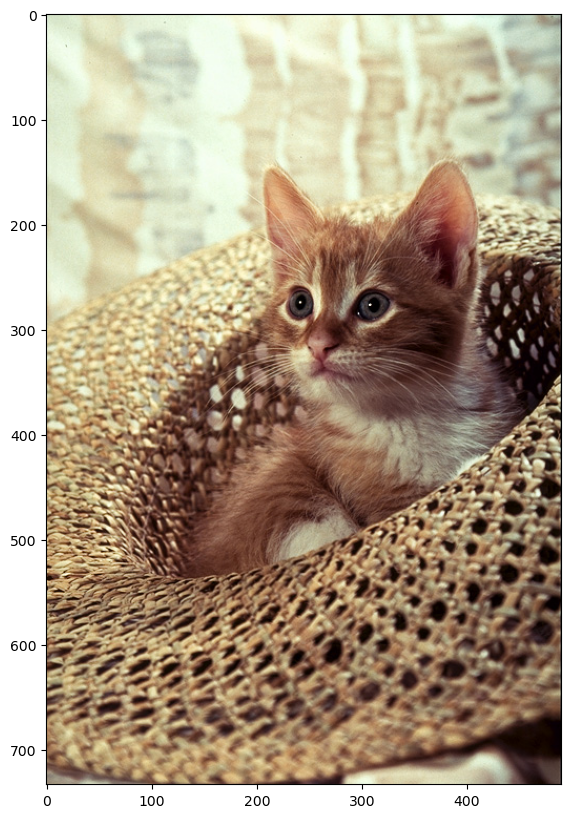

In [18]:
image = Image.open("cat.png")
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

In [20]:
array = np.array(image)
width, height, C = array.shape
print("width, height, C: ", width, height, C)

width, height, C:  733 490 3


In [22]:
array_flip = np.zeros((width, height, C), dtype = np.uint8)

In [24]:
for i, row in enumerate(array):
    array_flip[width - 1 - i,:,:] = 0
    

# PIL has several ways to flip an image, for example, we can use the ImageOps module:

In [25]:
from PIL import ImageOps

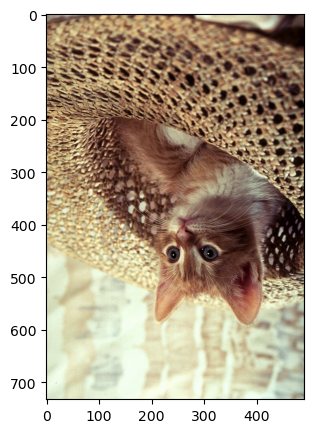

In [27]:
im_flip = ImageOps.flip(image)
plt.figure(figsize=(5,5))
plt.imshow(im_flip)
plt.show()

# Image Mirror

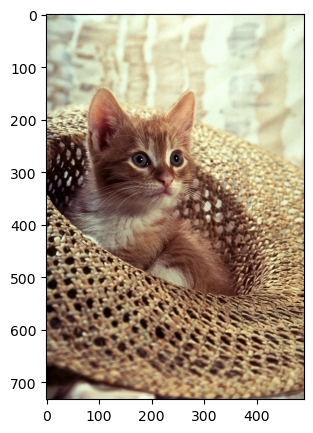

In [28]:
im_mirror = ImageOps.mirror(image)
plt.figure(figsize=(5,5))
plt.imshow(im_mirror)
plt.show()

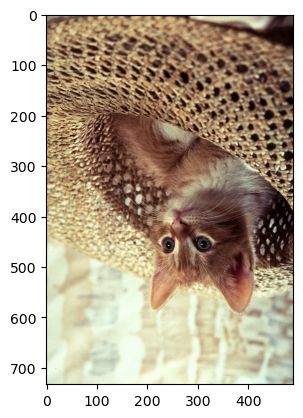

In [29]:
im_flip = image.transpose(1)
plt.imshow(im_flip)
plt.show()

The Image module has built-in attributes that describe the type of flip. The values are just integers. Several are shown in the following dict:

In [30]:
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,
        "ROTATE_90": Image.ROTATE_90,
        "ROTATE_180": Image.ROTATE_180,
        "ROTATE_270": Image.ROTATE_270,
        "TRANSPOSE": Image.TRANSPOSE, 
        "TRANSVERSE": Image.TRANSVERSE}

In [31]:
flip["FLIP_LEFT_RIGHT"]

0

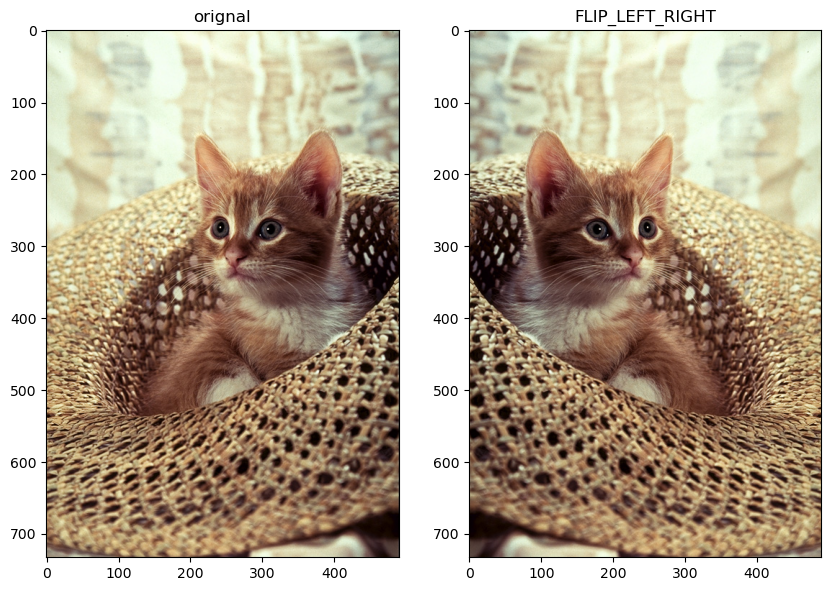

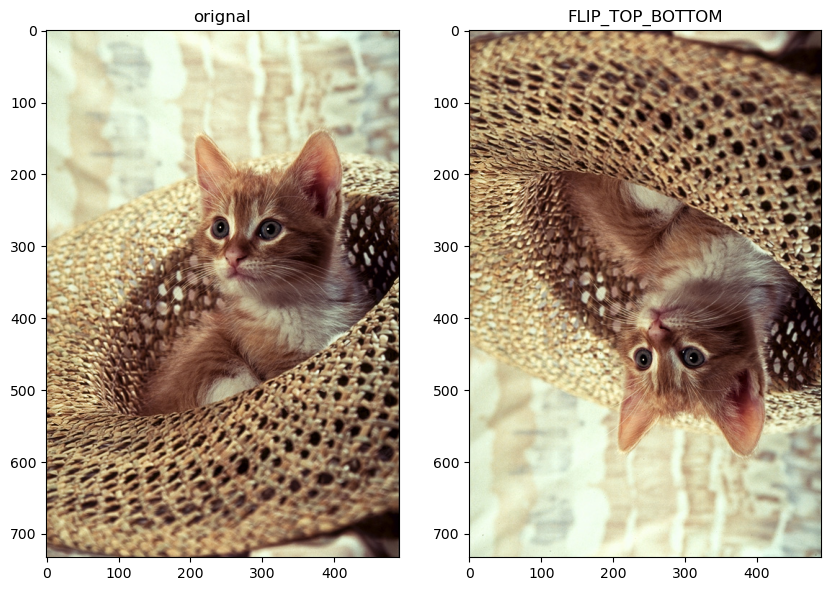

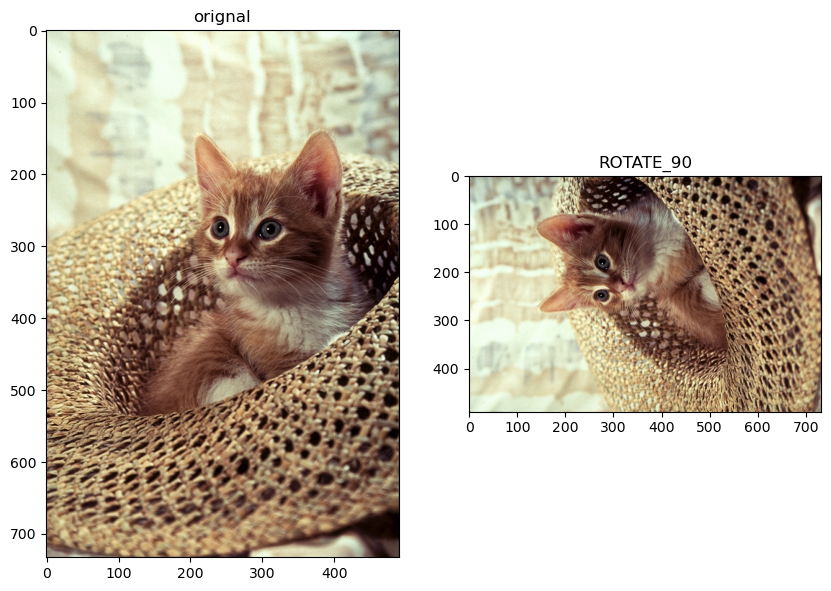

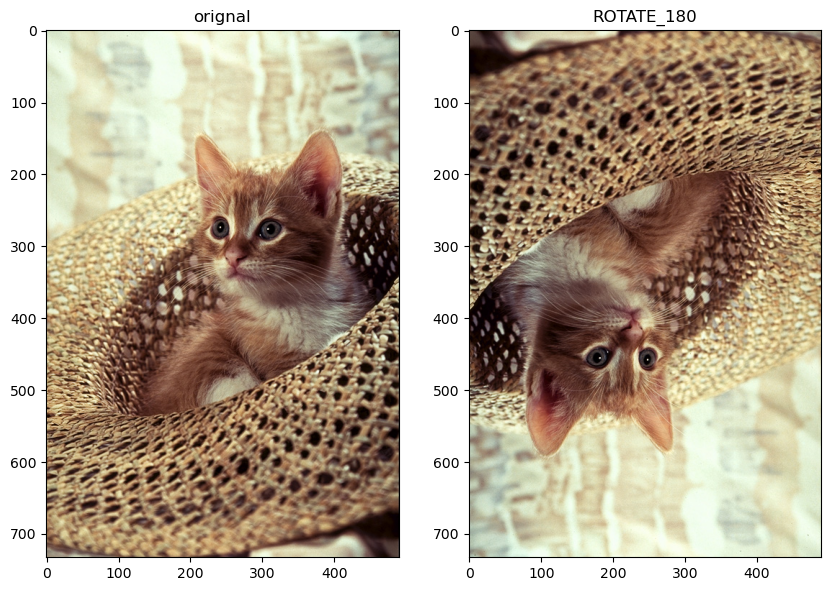

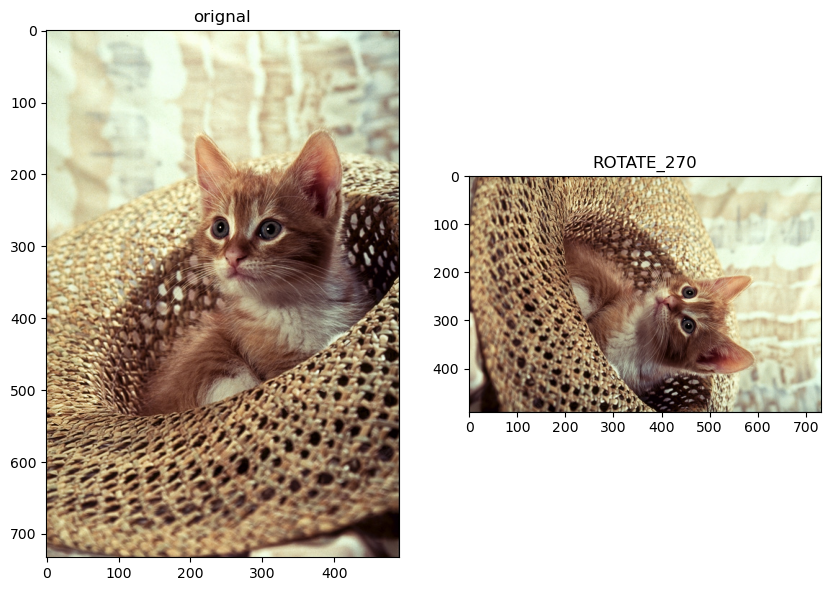

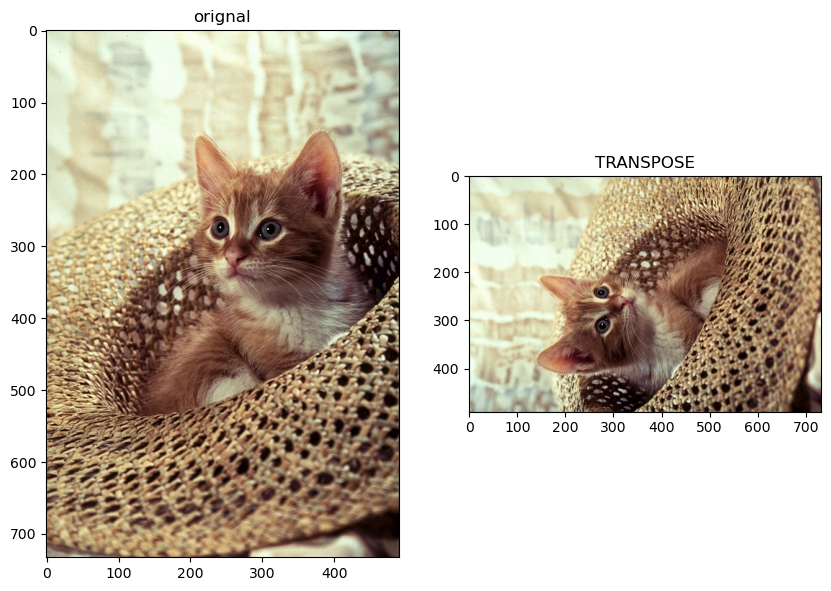

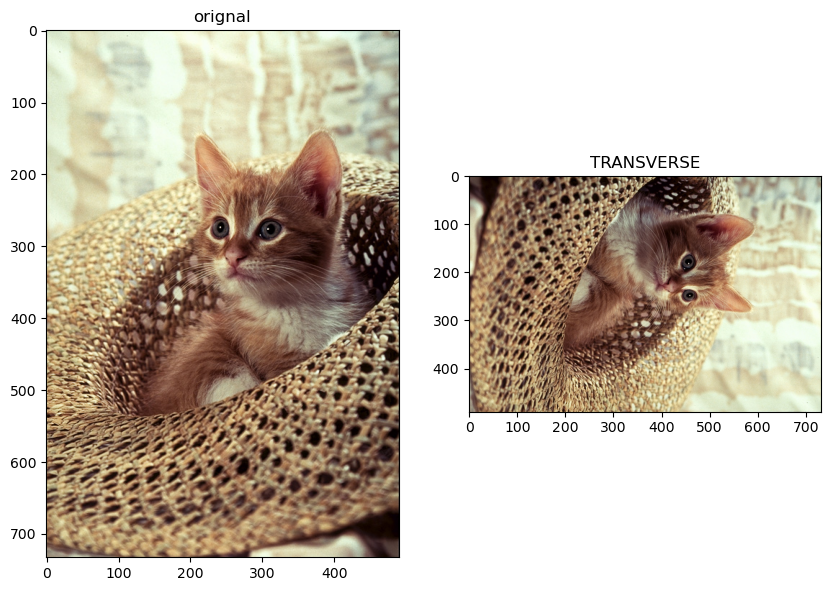

In [32]:
for key, values in flip.items():
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(image.transpose(values))
    plt.title(key)
    plt.show()

# Cropping an Image
Cropping is the act of "cutting out" a part of an image and throwing out the rest. We can perform cropping using array slicing.

Let start with a vertical crop: the variable upper is the index of the first row that we would like to include in the image, the variable lower is the index of the last row we would like to include. We then perform array slicing to obtain the new image.

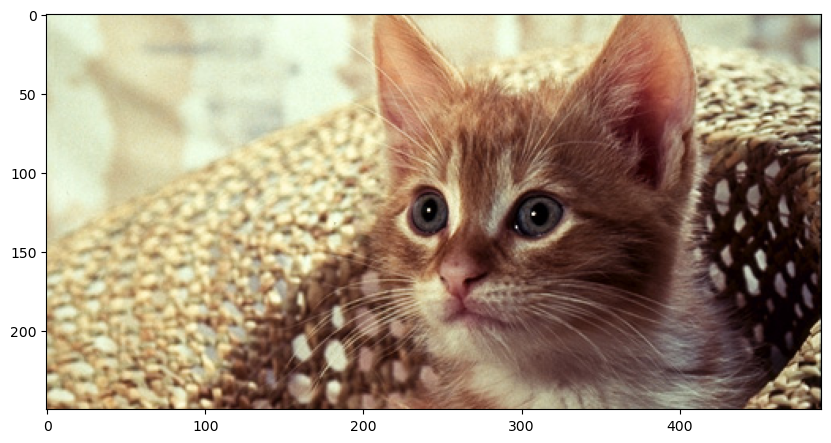

In [33]:
upper = 150
lower = 400
crop_top = array[upper:lower, :,:]
plt.figure(figsize=(10,10))
plt.imshow(crop_top)
plt.show()

# Horizontal Crop

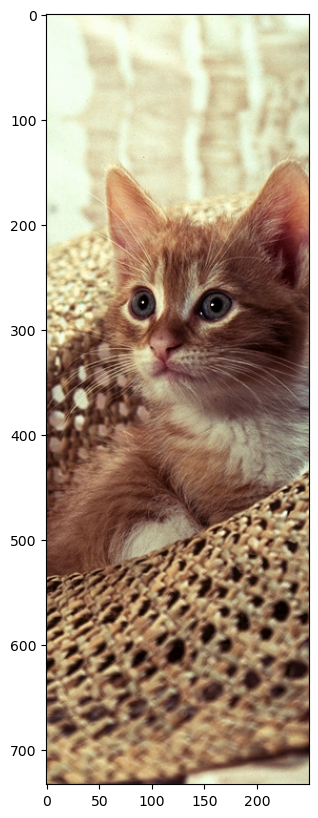

In [34]:
left = 150
right = 400
crop_right = array[:,left:right, :]
plt.figure(figsize=(10,10))
plt.imshow(crop_right)
plt.show()

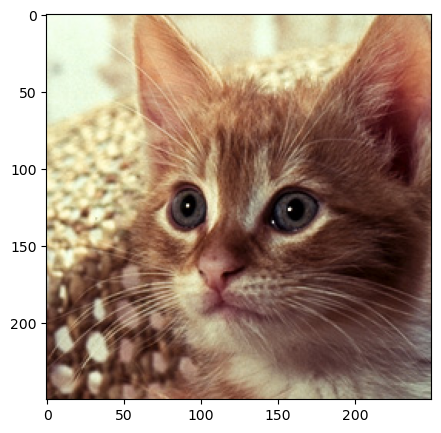

In [36]:
image = Image.open("cat.png")
crop_image = image.crop((left, upper, right, lower))
plt.figure(figsize=(5,5))
plt.imshow(crop_image)
plt.show()

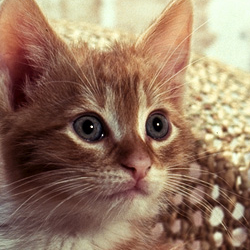

In [37]:
#Flip the image
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)
crop_image

# Changing Specific Image Pixels
We can change specific image pixels using array indexing; for example, we can set all the green and blue channels in the original image we cropped to zero:

In [41]:
array_sq = np.copy(array)
array_sq[upper:lower, left:right, 1:2] = 0

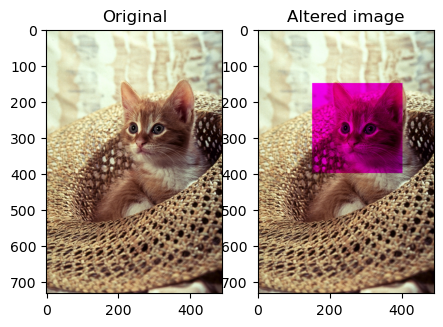

In [42]:
plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(array)
plt.title("Original")
plt.subplot(1,2,2)
plt.imshow(array_sq)
plt.title('Altered image')
plt.show()

We can also use the ImageDraw module from PIL library, which provides simple 2D graphics for Image objects

In [43]:
from PIL import ImageDraw

In [44]:
image_draw = image.copy()

In [45]:
image_fn = ImageDraw.Draw(im = image_draw)


We can draw a rectangle using the rectangle function, two important parameters include: xy – the coordinates bounding box and fill – Color of the rectangle.

In [46]:
shape = [left, right, upper, lower]
image_fn.rectangle(xy=shape, fill = 'red')

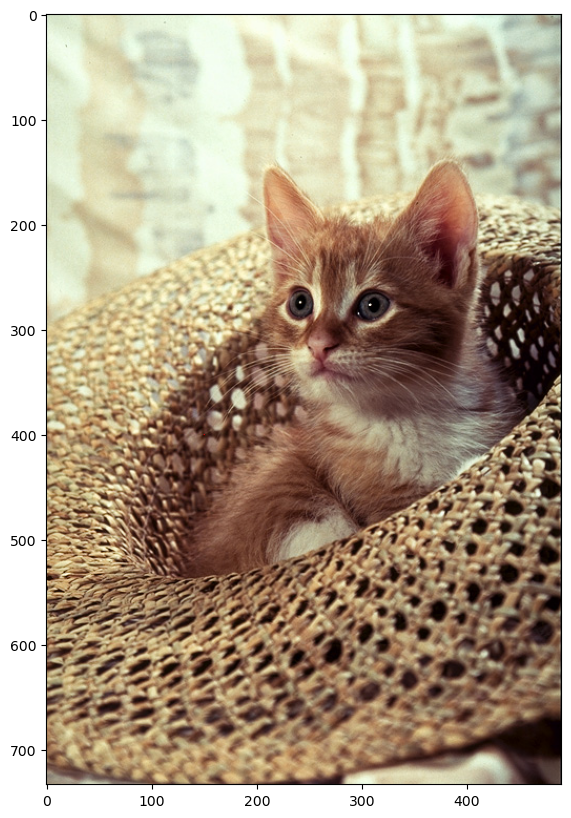

In [48]:
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

In [49]:
from PIL import ImageFont

In [55]:
image_fn.text(xy=(50,50),text="box",fill=(0,0,0))

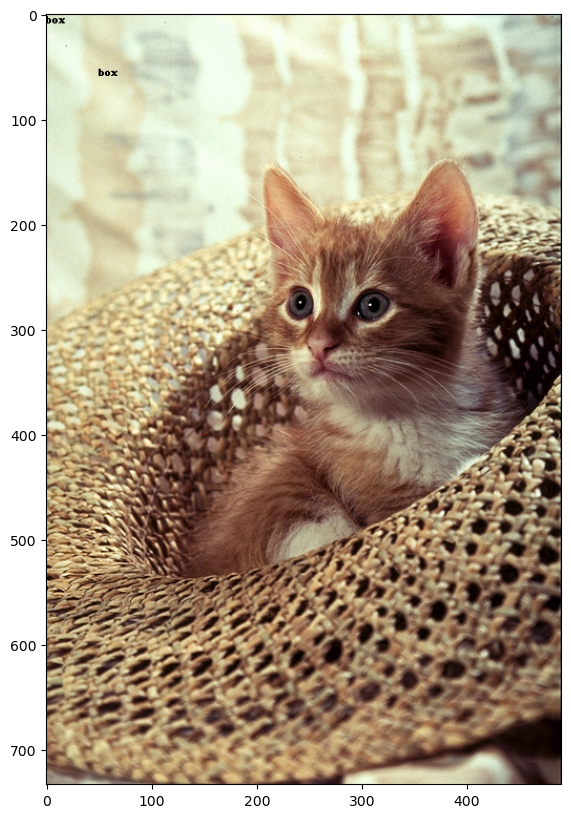

In [56]:
plt.figure(figsize=(10,10))
plt.imshow(image_draw)
plt.show()

In [58]:
image_lenna = Image.open("lenna.png")
array_lenna = np.array(image_lenna)

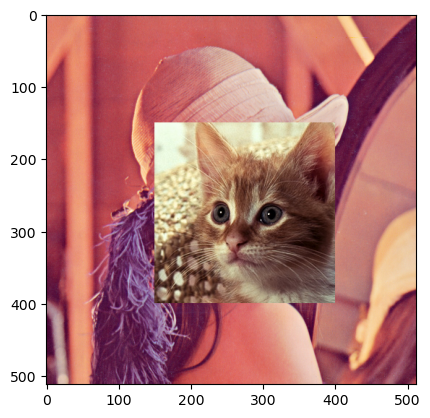

In [59]:
#resaasign pixel values
array_lenna[left:right, upper:lower, :] = array[left:right, upper:lower,:]
plt.imshow(array_lenna)
plt.show()

In the same manner, the paste() method allows you to overlay one image over another, with the input being the image you would like to overlay. The parameter box is the left and upper coordinate of the image:

In [60]:
image_lenna.paste(crop_image, box = (left, right))


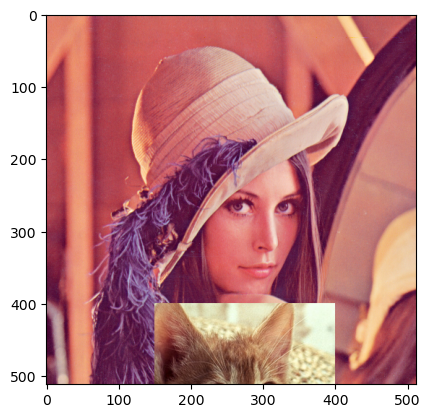

In [61]:
plt.imshow(image_lenna)
plt.show()

We can see the method copy() applies to some PIL objects. We create two image objects, we set new_image to the image, and we use the method copy() for the copy_image object.

In [62]:
image = Image.open("cat.png")
new_image = image
copy_image = image.copy()

Like the array, we see that the same memory address relationship exists. For example, if we don't use the method copy(), the image object has the same memory address as the original PIL image object.

In [63]:
id(image)==id(new_image)

True

In [64]:
id(image)==id(copy_image)

False

In [66]:
image_fn = ImageDraw.Draw(im = image)
image_fn.text(xy = (0,0), text = "box", fill = (0,0,0))
image_fn.rectangle(xy = shape, fill = 'red')

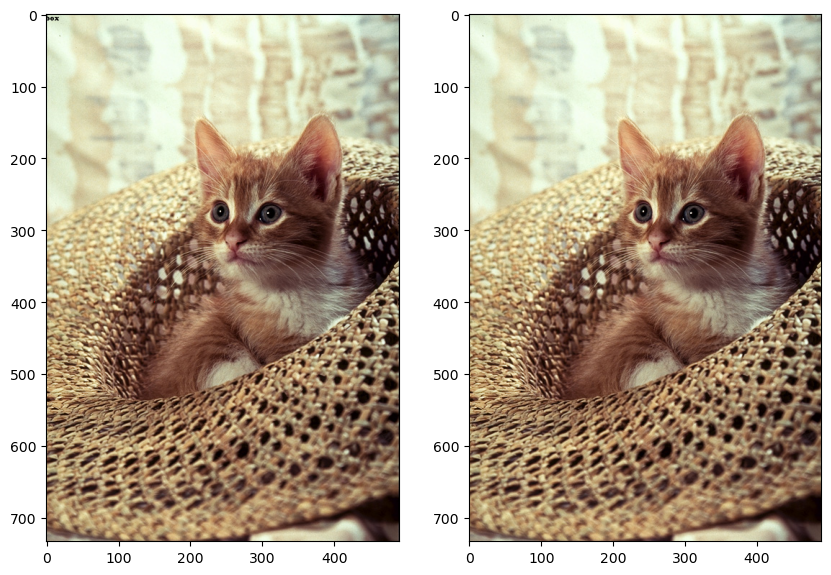

In [67]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(new_image)
plt.subplot(122)
plt.imshow(copy_image)
plt.show()

In [ ]:
#question for this lecture